# Examen final - Computación visual: Parte 1
Nombre: Julian David Osorio Amaya

## Instalación de librerías

In [1]:
!pip install -q opencv-python-headless scikit-image imageio


## Imports

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import filters, color, morphology, exposure
import imageio
from IPython.display import Image, display

## Imagen de animal en vía de extinción

In [3]:
from google.colab import files
uploaded = files.upload()

Saving animalextincion.jpg to animalextincion.jpg


In [4]:
fname = next(iter(uploaded.keys()))
print("Archivo cargado:", fname)

Archivo cargado: animalextincion.jpg


In [34]:
img_bgr = cv2.imread(fname)
img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
img = img.astype(np.uint8)
print("Tamaño:", img.shape)

Tamaño: (1200, 1600, 3)


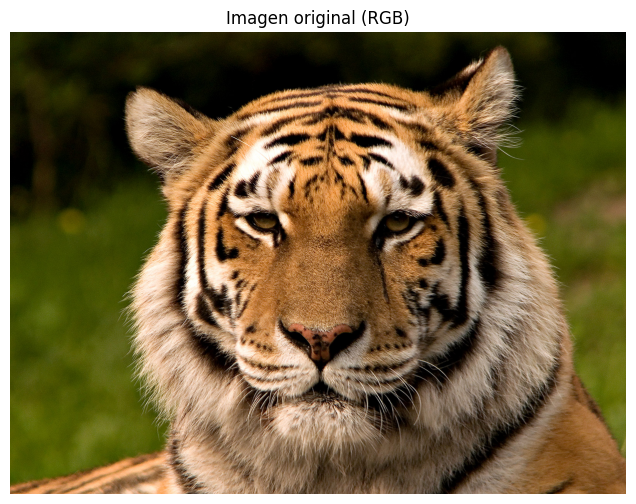

In [35]:
plt.figure(figsize=(8,6))
plt.imshow(img)
plt.axis('off')
plt.title('Imagen original (RGB)')
plt.show()


## Aplicación de filtros de desenfoque: Gaussiano y de mediana

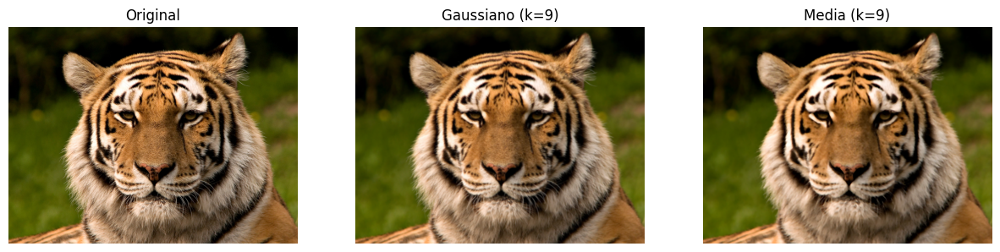

In [60]:
# Suavizado Gaussiano
gauss = cv2.GaussianBlur(img, ksize=(9,9), sigmaX=2)

# Suavizado con mediana
median = cv2.medianBlur(img, ksize=9)

fig, axs = plt.subplots(1,3, figsize=(15,6))
axs[0].imshow(img); axs[0].set_title('Original'); axs[0].axis('off')
axs[1].imshow(gauss); axs[1].set_title('Gaussiano (k=9)'); axs[1].axis('off')
axs[2].imshow(median); axs[2].set_title('Media (k=9)'); axs[2].axis('off')
plt.show()


## Aplicación de filtros de detección de bordes: Sobel y Unsharp

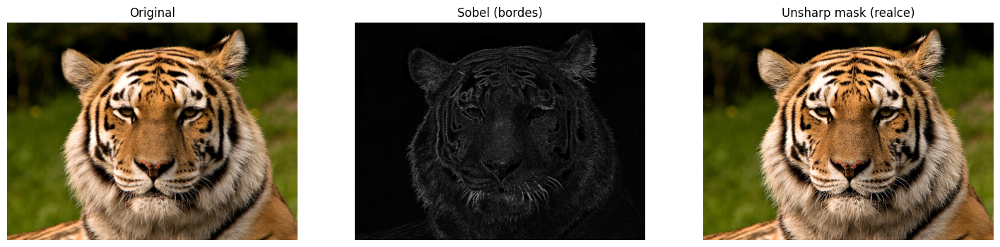

In [61]:
# Convertir a gris para detección de bordes
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

# Sobel
sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
sobel = np.hypot(sobelx, sobely)
sobel = (sobel / np.max(sobel) * 255).astype(np.uint8)

# Unsharp mask
gauss_small = cv2.GaussianBlur(img, (9,9), 10)
unsharp = cv2.addWeighted(img, 1.5, gauss_small, -0.5, 0)

# Mostrar
fig, axs = plt.subplots(1,3, figsize=(18,6))
axs[0].imshow(img); axs[0].set_title('Original'); axs[0].axis('off')
axs[1].imshow(sobel, cmap='gray'); axs[1].set_title('Sobel (bordes)'); axs[1].axis('off')
axs[2].imshow(unsharp); axs[2].set_title('Unsharp mask (realce)'); axs[2].axis('off')
plt.show()


## Visualización de canales de color RGB

In [62]:
R = img[:,:,0]
G = img[:,:,1]
B = img[:,:,2]

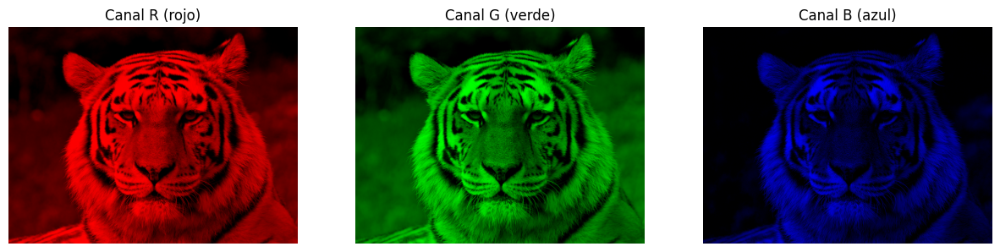

In [63]:
zeros = np.zeros_like(R)

R_rgb = np.stack([R, zeros, zeros], axis=-1)
G_rgb = np.stack([zeros, G, zeros], axis=-1)
B_rgb = np.stack([zeros, zeros, B], axis=-1)

fig, axs = plt.subplots(1,3, figsize=(15,5))
axs[0].imshow(R_rgb); axs[0].set_title('Canal R (rojo)'); axs[0].axis('off')
axs[1].imshow(G_rgb); axs[1].set_title('Canal G (verde)'); axs[1].axis('off')
axs[2].imshow(B_rgb); axs[2].set_title('Canal B (azul)'); axs[2].axis('off')
plt.show()


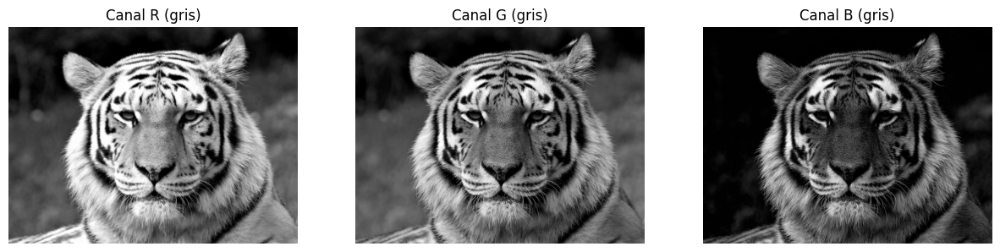

In [64]:
fig, axs = plt.subplots(1,3, figsize=(15,5))
axs[0].imshow(R, cmap='gray'); axs[0].set_title('Canal R (gris)'); axs[0].axis('off')
axs[1].imshow(G, cmap='gray'); axs[1].set_title('Canal G (gris)'); axs[1].axis('off')
axs[2].imshow(B, cmap='gray'); axs[2].set_title('Canal B (gris)'); axs[2].axis('off')
plt.show()

## Visualización de operaciones morfológicas

### Binarización

Umbral Otsu: 105.0


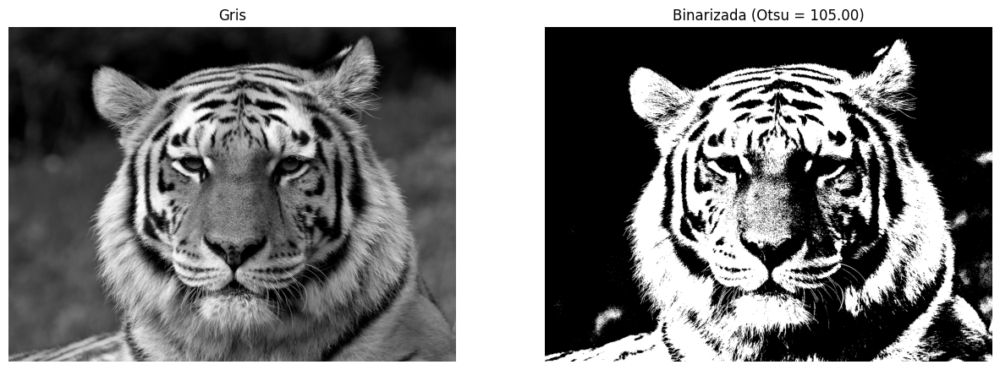

In [65]:
# Escala de grises (float 0..1)
gray_f = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

# Binarización con Otsu
th_val, binary = cv2.threshold(gray_f, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
binary = binary.astype(np.uint8)

print("Umbral Otsu:", th_val)
fig, axs = plt.subplots(1,2, figsize=(15,6))
axs[0].imshow(gray_f, cmap='gray'); axs[0].set_title('Gris'); axs[0].axis('off')
axs[1].imshow(binary, cmap='gray'); axs[1].set_title(f'Binarizada (Otsu = {th_val:.2f})'); axs[1].axis('off')
plt.show()


### Aplicación de operaciones morfológicas

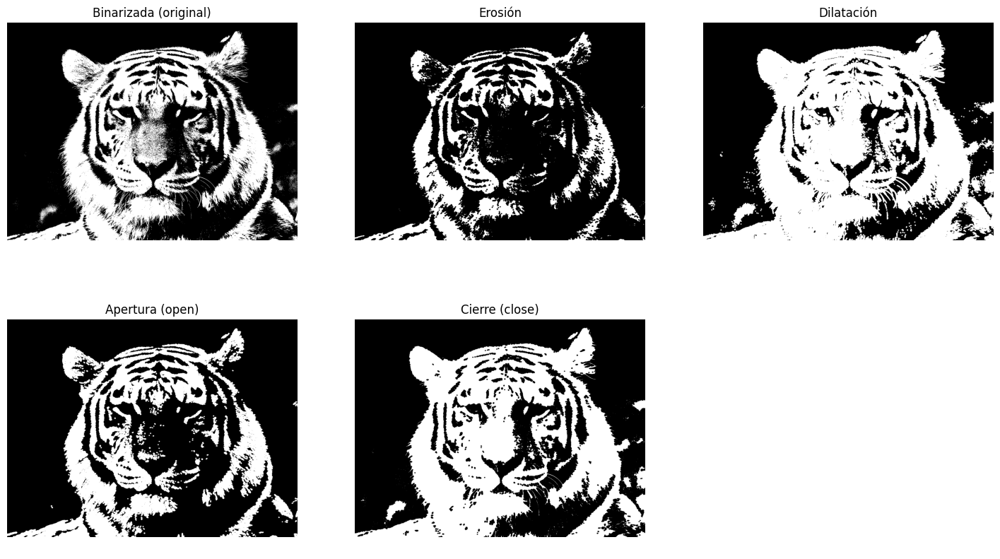

In [66]:
# Structuring element
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7,7))

# Operaciones (sobre imagen binarizada)
erosion = cv2.erode(binary, kernel, iterations=1)
dilation = cv2.dilate(binary, kernel, iterations=1)
opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)   # erosion seguido de dilatación
closing = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel)  # dilatación seguido de erosión

# Mostrar resultados
fig, axs = plt.subplots(2,3, figsize=(18,10))
axs = axs.ravel()
axs[0].imshow(binary, cmap='gray'); axs[0].set_title('Binarizada (original)'); axs[0].axis('off')
axs[1].imshow(erosion, cmap='gray'); axs[1].set_title('Erosión'); axs[1].axis('off')
axs[2].imshow(dilation, cmap='gray'); axs[2].set_title('Dilatación'); axs[2].axis('off')
axs[3].imshow(opening, cmap='gray'); axs[3].set_title('Apertura (open)'); axs[3].axis('off')
axs[4].imshow(closing, cmap='gray'); axs[4].set_title('Cierre (close)'); axs[4].axis('off')
axs[5].axis('off')
plt.show()


## Visualización de *gif*

### Generación de gif

In [67]:
# Preparar frames (convertir a uint8 imágenes RGB o grayscale convertidas a RGB para GIF)
def to_rgb_for_gif(im):
    if im.ndim == 2:  # grayscale -> RGB
        return np.stack([im]*3, axis=-1)
    return im

frames = []
frames.append(to_rgb_for_gif(img))
frames.append(to_rgb_for_gif(gauss))
frames.append(to_rgb_for_gif(unsharp))
frames.append(to_rgb_for_gif(cv2.cvtColor(sobel, cv2.COLOR_GRAY2RGB)))
frames.append(to_rgb_for_gif(binary))
frames.append(to_rgb_for_gif(opening))
frames.append(to_rgb_for_gif(closing))
frames.append(to_rgb_for_gif(R_rgb))
frames.append(to_rgb_for_gif(G_rgb))
frames.append(to_rgb_for_gif(B_rgb))

# Normalizar a uint8 si hace falta
frames_uint8 = []
for f in frames:
    f = np.asarray(f)
    if f.max() <= 1.0:
        f = (f*255).astype(np.uint8)
    else:
        f = f.astype(np.uint8)
    frames_uint8.append(f)


### Visualización y almacenamiento de gif

In [68]:
gif_path = 'resultado_animacion.gif'
# duracón en milisegundos por frame
imageio.mimsave(gif_path, frames_uint8, duration=1000)
print("GIF guardado en:", gif_path)


GIF guardado en: resultado_animacion.gif


<IPython.core.display.Javascript object>

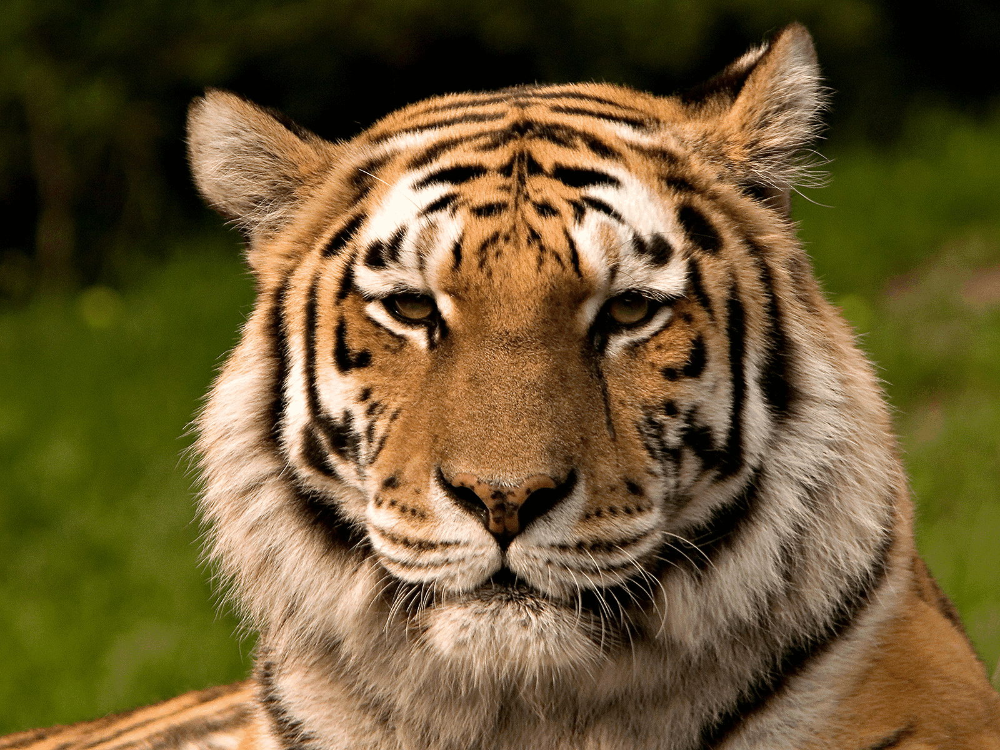

In [69]:
from IPython.display import Javascript, display

# This command tells Colab to automatically adjust the cell height.
# Setting the first parameter to 0 enables auto-sizing, and 'true' enables
# expansion beyond the initial small height. The maxHeight option prevents
# it from becoming excessively large.
display(Javascript('''google.colab.output.setIframeHeight(0, true, {maxHeight: 5000});'''))

# Mostrar gif generado
display(Image(gif_path))

### Descarga de resultados

In [70]:
# Guardar algunos resultados como archivos
cv2.imwrite('original_rgb.png', cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
cv2.imwrite('gauss.png', cv2.cvtColor(gauss, cv2.COLOR_RGB2BGR))
cv2.imwrite('unsharp.png', cv2.cvtColor(unsharp, cv2.COLOR_RGB2BGR))
cv2.imwrite('sobel.png', sobel)
cv2.imwrite('binary.png', binary)
cv2.imwrite('opening.png', opening)
cv2.imwrite('closing.png', closing)

# Si quieres descargar (Colab)
from google.colab import files
files.download(gif_path)  # descarga el gif


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Conclusiones

- **Efecto del suavizado**:
  - **Gaussiano**: Suaviza la imagen de forma uniforme, reduce el ruido pero también difumina los detalles.
  - **Mediano**: Suaviza sin perder tanto los bordes. Elimina mejor el ruido puntual.
- **Efecto del realce de bordes**:
  - **Sobel**: Resalta los bordes principales, mostrando claramente los contornos del tigre.
  - **Unsharp**: Aumenta la nitidez general. Mejora los detalles sin distorsionar la imagen original.
- **Canales RGB**:
  - **R**: Resalta las zonas cálidas del tigre (pelaje). Estas se ven más claras.
  - **G**: Muestra un contraste equilibrado entre el tigre y el fondo.
  - **B**: Las zonas del tigre se ven más oscuras porque tiene poca componente azul.
- **Operaciones morfológicas**:
  - **Erosión**: Reduce las zonas blancas y elimina pequeños detalles.
  - **Dilatación**: Aumenta las zonas blancas y rellena huecos.
  - **Apertura**: Limpia ruido pequeño sin deformar mucho la forma principal.
  - **Cierre**: Cierra huecos y une partes separadas del objeto.
